In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout
from sklearn.preprocessing import MinMaxScaler
from keras import optimizers
from sklearn.metrics import mean_squared_error

In [2]:
def preparedata(file):
    cloud_cover = pd.read_csv(file, skipinitialspace = True)
    cloud_cover['Date'] = cloud_cover[['Year', 'Month', 'Day']].apply(lambda x: "{0}-{1}-{2}".format(str(x[0]).zfill(2), str(x[1]).zfill(2), str(x[2]).zfill(2)), axis=1) 
    cloud_cover['Time'] = cloud_cover[['Hour', 'Minute']].apply(lambda x: "{}:{}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Year", "Month", "Day", "Hour", "Minute", "Second"], axis=1, inplace=True)  
    cloud_cover = cloud_cover.rename(columns={"CloudCover":"cloud_cover"})
    cloud_cover = cloud_cover.groupby(['Date', 'Time']).agg(cloud_cover=('cloud_cover','mean')).reset_index()
    cloud_cover['DateTime'] = cloud_cover[['Date', 'Time']].apply(lambda x: "{} {}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Date", "Time"], axis=1, inplace=True)        
    cloud_cover['DateTime'] = pd.to_datetime(cloud_cover['DateTime'], format="%Y-%m-%d %H:%M")
    cloud_cover.dropna(inplace=True)
    return cloud_cover

In [3]:
def lags_train_test(data, lags):
	X, y = [], []
	for i in range(lags, len(data)):
		X.append(data[i-lags:i])
		y.append(data[i])
	return np.array(X), np.array(y)

In [4]:
def Xtrain_ytrain(train,test,lags):
    #scale train
    sc = MinMaxScaler()
    sc.fit(train)
    train_set_scale = sc.transform(train)
    # train
    X_train, y_train = lags_train_test(train_set_scale, lags)
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
    print("X_train Shape :", X_train.shape)
    print("y_train Shape :", y_train.shape)

    #scale test
    dataset_total = pd.concat((train['cloud_cover'], test['cloud_cover']), axis=0)
    inputs = dataset_total[len(dataset_total) - len(test) - lags:].values
    inputs = inputs.reshape(-1,1)
    inputs = sc.transform(inputs)
    # test
    X_test, y_test = lags_train_test(inputs, lags)
    print("X_test Shape : ", X_test.shape)
    print("y_test Shape : ", y_test.shape)
    return X_train, y_train, X_test, y_test, sc

In [5]:
def plot_curve(history):
    print('Last train loss: %s'%history.history['loss'][-1])
    print('Last validation loss: %s'%history.history['val_loss'][-1])
    
    # loss curves
    plt.figure(figsize=[8,6])

    loss = history.history['loss']
    val_loss = history.history['val_loss']
    
    epochs = range(1, len(loss) + 1)

    # Plot loss
    plt.plot(epochs, loss, 'c--', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [6]:
def compare_mse_model(model,model_1):
    mse_error = [model,model_1]
    error = pd.DataFrame({"Model" : ['model','model_1'], "MSE error": mse_error})
    if model < model_1:
        model = model
        print("Better MSE value is : " , model)
    else:
        model_1 = model_1
        print("Better MSE value is : ", model_1)
    return error

In [7]:
cloud_cover = preparedata('../succeed-prophet/Bangkhuntean_CloudCover_2021-16Nov-16Dec.csv')
cloud_cover

,cloud_cover,DateTime
0,0.990000,2021-11-16 11:15:00
1,0.989000,2021-11-16 11:16:00
2,0.987667,2021-11-16 11:17:00
3,0.987000,2021-11-16 11:18:00
4,0.987000,2021-11-16 11:19:00
...,...,...
15056,0.168000,2021-12-16 13:58:00
15057,0.169000,2021-12-16 13:59:00
15058,0.147000,2021-12-16 14:00:00
15059,0.145000,2021-12-16 14:01:00


# Train/Test Model ,lags=10

In [8]:
train = cloud_cover[cloud_cover['DateTime'] < '2021-12-16 00:00:00']
test = cloud_cover[cloud_cover['DateTime'] >= '2021-12-16 00:00:00']

train = train.set_index('DateTime')
test = test.set_index('DateTime')

X_train, y_train, X_test, y_test, sc = Xtrain_ytrain(train,test,10)

X_train Shape : (14758, 10, 1)
y_train Shape : (14758, 1)
X_test Shape :  (293, 10, 1)
y_test Shape :  (293, 1)


c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


In [9]:
train.reset_index(inplace=True)
test.reset_index(inplace=True)

## Optimizer adam

### Add frist layer: units = 50

In [10]:
test1 = test.copy()

In [11]:
model_50_adam = Sequential()
model_50_adam.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_adam.add(Dense(units = 1))
model_50_adam.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_adam = model_50_adam.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 9s 10ms/step - loss: 0.0120 - accuracy: 0.0085 - val_loss: 0.0060 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0028 - accuracy: 0.0088 - val_loss: 0.0043 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 3s 8ms/step - loss: 0.0022 - accuracy: 0.0088 - val_loss: 0.0033 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0018 - accuracy: 0.0088 - val_loss: 0.0029 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0016 - accuracy: 0.0088 - val_loss: 0.0025 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.0022 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0021 - va

Last train loss: 0.0012012296356260777
Last validation loss: 0.001875867834314704
Last train accuracy: 0.008808781392872334
Last validation accuracy: 0.0


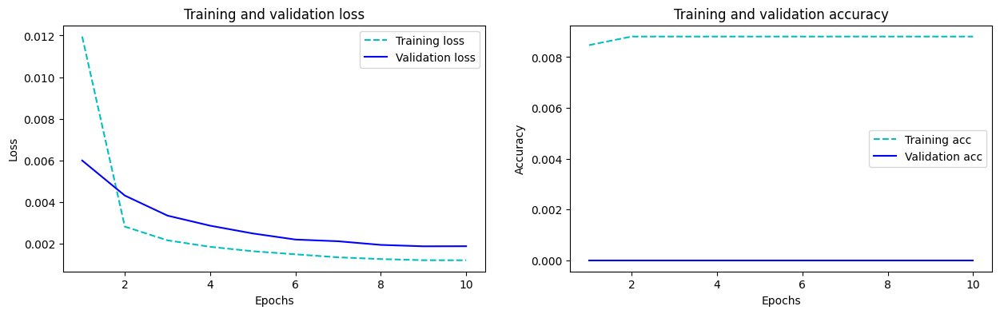

In [12]:
plot_curve(hist_adam)

In [13]:
predict_scaled_adam = model_50_adam.predict(X_test)
predict_adam = sc.inverse_transform(predict_scaled_adam)
test1['LSTM_adam'] = predict_adam
test1

10/10 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_adam
0,2021-12-16 09:10:00,0.111,0.329080
1,2021-12-16 09:11:00,0.112,0.144234
2,2021-12-16 09:12:00,0.116,0.116886
3,2021-12-16 09:13:00,0.112,0.117655
4,2021-12-16 09:14:00,0.099,0.115138
...,...,...,...
288,2021-12-16 13:58:00,0.168,0.167581
289,2021-12-16 13:59:00,0.169,0.167261
290,2021-12-16 14:00:00,0.147,0.167989
291,2021-12-16 14:01:00,0.145,0.150287


In [14]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_adam'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [15]:
lstm_mse_error_unit_50_adam = mean_squared_error(test1['cloud_cover'], test1['LSTM_adam'], squared=True)
lstm_mse_error_unit_50_adam

0.001866500333416413

In [26]:
mse_data = pd.DataFrame(columns=['Model' ,'LSTM lag10'])
mse_data.loc[len(mse_data)] = ['Lstm mse error unit 50 adam', lstm_mse_error_unit_50_adam]
mse_data

,Model,LSTM lag10
0,Lstm mse error unit 50 adam,0.001867


----------------------------------------------------------------------------------

## Optimizer RMSprop

### Add frist layer: units = 50

In [21]:
model_50_rms = Sequential()
model_50_rms.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_rms.add(Dense(units = 1))
model_50_rms.compile(optimizer = 'RMSprop', loss = 'mean_squared_error')
hist_50_rms = model_50_rms.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 8s 9ms/step - loss: 0.0048 - accuracy: 0.0087 - val_loss: 0.0036 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0019 - accuracy: 0.0088 - val_loss: 0.0023 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0021 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0025 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 3s 8ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val

Last train loss: 0.0012066577328369021
Last validation loss: 0.0018918951973319054
Last train accuracy: 0.008808781392872334
Last validation accuracy: 0.0


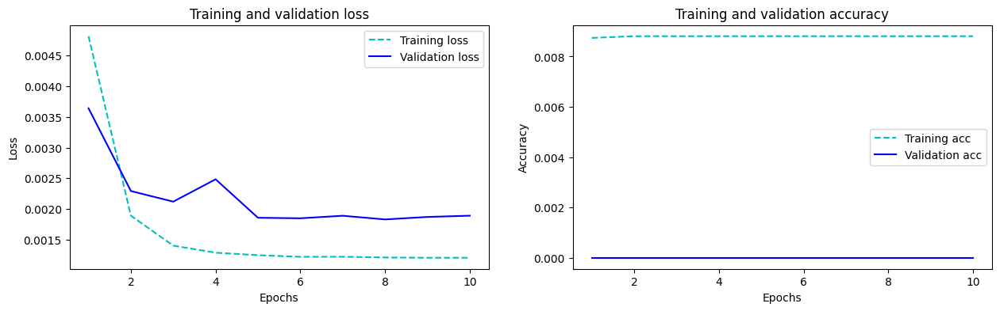

In [22]:
plot_curve(hist_50_rms)

In [23]:
predict_scaled_50_rms = model_50_rms.predict(X_test)
predict_50_rms = sc.inverse_transform(predict_scaled_50_rms)
test1['LSTM_50_rms'] = predict_50_rms
test1

10/10 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_sgd,LSTM_50_rms
0,2021-12-16 09:10:00,0.111,0.329080,0.306587,0.318365
1,2021-12-16 09:11:00,0.112,0.144234,0.272192,0.114401
2,2021-12-16 09:12:00,0.116,0.116886,0.242533,0.100261
3,2021-12-16 09:13:00,0.112,0.117655,0.218071,0.107861
4,2021-12-16 09:14:00,0.099,0.115138,0.196742,0.107278
...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.167581,0.171411,0.159219
289,2021-12-16 13:59:00,0.169,0.167261,0.170593,0.159035
290,2021-12-16 14:00:00,0.147,0.167989,0.170125,0.159957
291,2021-12-16 14:01:00,0.145,0.150287,0.165415,0.139566


In [24]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_50_rms'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [25]:
lstm_mse_error_unit_50_rms = mean_squared_error(test1['cloud_cover'], test1['LSTM_50_rms'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_rms)

Better MSE value is :  0.001866500333416413


,Model,MSE error
0,model,0.001867
1,model_1,0.001882


In [28]:
mse_data.loc[len(mse_data)] = ['Lstm mse error unit 50 rmsprop', lstm_mse_error_unit_50_rms]

----------------------------------------------------------------------------------

## Optimizer adam

### Add frist layer: units = 50 and batch_size 64

In [29]:
model_batch_size64 = Sequential()
model_batch_size64.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_batch_size64.add(Dense(units = 1))
model_batch_size64.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_batch_size64 = model_batch_size64.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 64)

Epoch 1/10
231/231 [==============================] - 7s 12ms/step - loss: 0.0176 - accuracy: 0.0085 - val_loss: 0.0066 - val_accuracy: 0.0000e+00
Epoch 2/10
231/231 [==============================] - 2s 9ms/step - loss: 0.0033 - accuracy: 0.0088 - val_loss: 0.0059 - val_accuracy: 0.0000e+00
Epoch 3/10
231/231 [==============================] - 2s 10ms/step - loss: 0.0029 - accuracy: 0.0088 - val_loss: 0.0050 - val_accuracy: 0.0000e+00
Epoch 4/10
231/231 [==============================] - 2s 9ms/step - loss: 0.0025 - accuracy: 0.0088 - val_loss: 0.0041 - val_accuracy: 0.0000e+00
Epoch 5/10
231/231 [==============================] - 2s 9ms/step - loss: 0.0021 - accuracy: 0.0088 - val_loss: 0.0035 - val_accuracy: 0.0000e+00
Epoch 6/10
231/231 [==============================] - 2s 9ms/step - loss: 0.0020 - accuracy: 0.0088 - val_loss: 0.0033 - val_accuracy: 0.0000e+00
Epoch 7/10
231/231 [==============================] - 2s 10ms/step - loss: 0.0019 - accuracy: 0.0088 - val_loss: 0.0032 - 

Last train loss: 0.001556146889925003
Last validation loss: 0.0025025452487170696
Last train accuracy: 0.008808781392872334
Last validation accuracy: 0.0


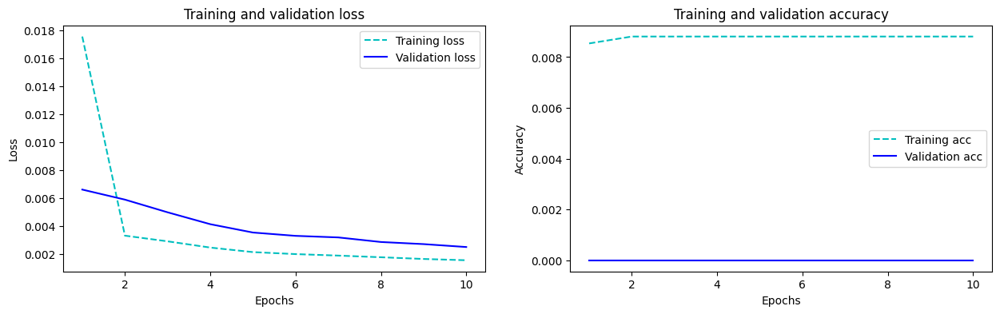

In [30]:
plot_curve(hist_batch_size64)

In [31]:
predict_scaled_batch_size64 = model_batch_size64.predict(X_test)
predict_batch_size64 = sc.inverse_transform(predict_scaled_batch_size64)
test1['LSTM_4_batch_size'] = predict_batch_size64
test1

10/10 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_sgd,LSTM_50_rms,LSTM_4_batch_size
0,2021-12-16 09:10:00,0.111,0.329080,0.306587,0.318365,0.327040
1,2021-12-16 09:11:00,0.112,0.144234,0.272192,0.114401,0.241542
2,2021-12-16 09:12:00,0.116,0.116886,0.242533,0.100261,0.178393
3,2021-12-16 09:13:00,0.112,0.117655,0.218071,0.107861,0.141788
4,2021-12-16 09:14:00,0.099,0.115138,0.196742,0.107278,0.122040
...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.167581,0.171411,0.159219,0.172546
289,2021-12-16 13:59:00,0.169,0.167261,0.170593,0.159035,0.172125
290,2021-12-16 14:00:00,0.147,0.167989,0.170125,0.159957,0.172289
291,2021-12-16 14:01:00,0.145,0.150287,0.165415,0.139566,0.164306


In [32]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_4_batch_size'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [33]:
lstm_mse_error_batch_size64 = mean_squared_error(test1['cloud_cover'], test1['LSTM_4_batch_size'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_batch_size64)

Better MSE value is :  0.001866500333416413


,Model,MSE error
0,model,0.001867
1,model_1,0.002490


In [34]:
mse_data.loc[len(mse_data)] = ['Lstm mse error 50 adam batch_size64', lstm_mse_error_batch_size64]

---

## learning rate 0.1

In [35]:
test2 = test.copy()

#### Add frist layer: units = 50

In [91]:
model_01 = Sequential()
model_01.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_01.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.1)
model_01.compile(optimizer = opt, loss = 'mean_squared_error')
hist_01 = model_01.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 8s 8ms/step - loss: 0.0675 - accuracy: 0.0088 - val_loss: 0.0024 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0030 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.0022 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0018 - val

Last train loss: 0.0014334468869492412
Last validation loss: 0.010108359158039093
Last train accuracy: 0.008808781392872334
Last validation accuracy: 0.0


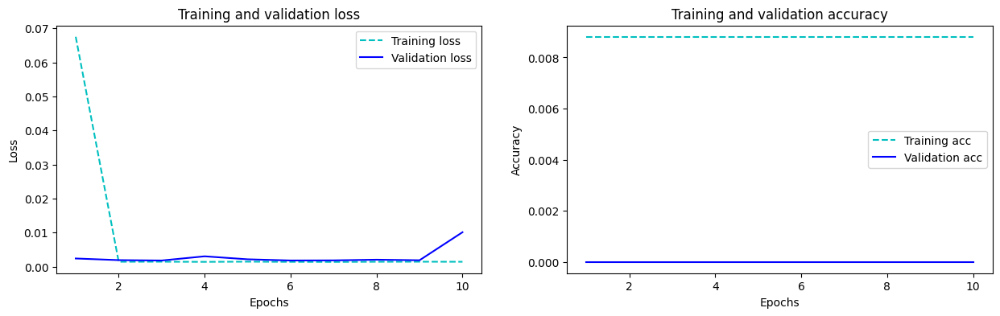

In [92]:
plot_curve(hist_01)

In [93]:
predict_scaled_01 = model_01.predict(X_test)
predict_01 = sc.inverse_transform(predict_scaled_01)
test2['LSTM_01'] = predict_01
test2

10/10 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005,LSTM_0001
0,2021-12-16 09:10:00,0.111,0.415891,0.321854,0.351959,0.330268,0.351959
1,2021-12-16 09:11:00,0.112,0.206173,0.120153,0.148654,0.134199,0.148654
2,2021-12-16 09:12:00,0.116,0.205139,0.098979,0.143562,0.119554,0.143562
3,2021-12-16 09:13:00,0.112,0.220407,0.108276,0.150429,0.120861,0.150429
4,2021-12-16 09:14:00,0.099,0.209192,0.111055,0.147029,0.117477,0.147029
...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.261574,0.163278,0.198684,0.171629,0.198684
289,2021-12-16 13:59:00,0.169,0.261467,0.163046,0.198642,0.171516,0.198642
290,2021-12-16 14:00:00,0.147,0.262520,0.164024,0.199593,0.172385,0.199593
291,2021-12-16 14:01:00,0.145,0.241763,0.143435,0.178683,0.152335,0.178683


In [94]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_01'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [95]:
lstm_mse_error_unit_50_01 = mean_squared_error(test2['cloud_cover'], test2['LSTM_01'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_01)

Better MSE value is :  0.001866500333416413


,Model,MSE error
0,model,0.001867
1,model_1,0.010058


In [96]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 50 learning rate 0.1', lstm_mse_error_unit_50_01]
mse_data

,Model,LSTM lag10
0,Lstm mse error unit 50 adam,0.001867
1,Lstm mse error unit 50 sgd,0.005053
2,Lstm mse error unit 50 rmsprop,0.001882
3,Lstm mse error adam batch_size64,0.002490
4,Lstm mse error adam learning rate 0.1,0.010058


----------------------------------------------------------------------------------

### lr 0.05

#### Add frist layer: units = 50

In [41]:
model_005 = Sequential()
model_005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.05)
model_005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_005 = model_005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 7s 8ms/step - loss: 0.0104 - accuracy: 0.0087 - val_loss: 0.0024 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0022 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0024 - val

Last train loss: 0.0013162334216758609
Last validation loss: 0.0018392202910035849
Last train accuracy: 0.008808781392872334
Last validation accuracy: 0.0


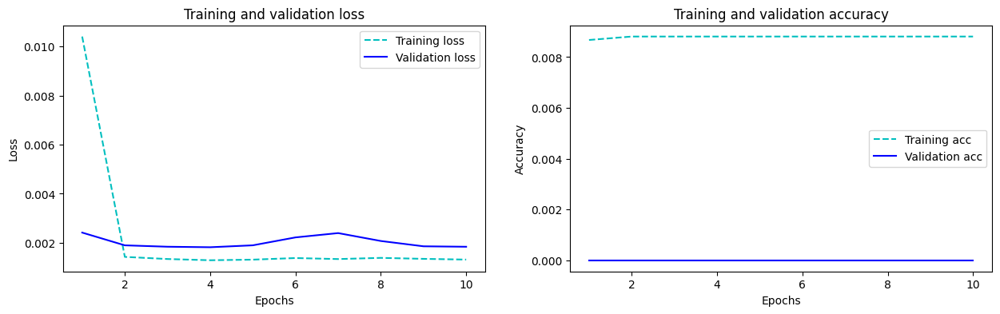

In [42]:
plot_curve(hist_005)

In [43]:
predict_scaled_005 = model_005.predict(X_test)
predict_005 = sc.inverse_transform(predict_scaled_005)
test2['LSTM_005'] = predict_005
test2

10/10 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005
0,2021-12-16 09:10:00,0.111,0.661765,0.321854
1,2021-12-16 09:11:00,0.112,0.661765,0.120153
2,2021-12-16 09:12:00,0.116,0.661765,0.098979
3,2021-12-16 09:13:00,0.112,0.661765,0.108276
4,2021-12-16 09:14:00,0.099,0.661765,0.111055
...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.661765,0.163278
289,2021-12-16 13:59:00,0.169,0.661765,0.163046
290,2021-12-16 14:00:00,0.147,0.661765,0.164024
291,2021-12-16 14:01:00,0.145,0.661765,0.143435


In [44]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [45]:
lstm_mse_error_unit_50_005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_005'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_005)

Better MSE value is :  0.0018300354978602964


,Model,MSE error
0,model,0.001867
1,model_1,0.001830


In [97]:
mse_data.loc[len(mse_data)] = ['Lstm mse error 50 adam learning rate 0.05', lstm_mse_error_unit_50_005]

----------------------------------------------------------------------------------

### lr 0.01

#### Add frist layer: units = 50

In [74]:
model_001 = Sequential()
model_001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.01)
model_001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_001 = model_001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 10s 11ms/step - loss: 0.0045 - accuracy: 0.0088 - val_loss: 0.0028 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 4s 10ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.0023 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 4s 9ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 3s 8ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 3s 8ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - 

Last train loss: 0.001219825237058103
Last validation loss: 0.0026672924868762493
Last train accuracy: 0.008808781392872334
Last validation accuracy: 0.0


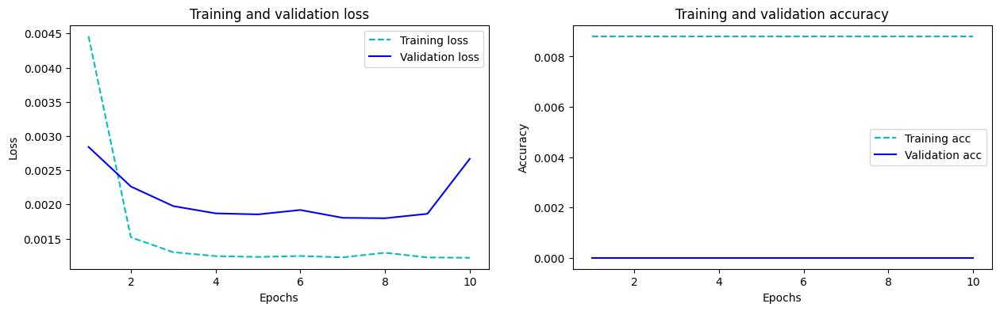

In [75]:
plot_curve(hist_001)

In [76]:
predict_scaled_001 = model_001.predict(X_test)
predict_001 = sc.inverse_transform(predict_scaled_001)
test2['LSTM_001'] = predict_001
test2

10/10 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005,LSTM_0001
0,2021-12-16 09:10:00,0.111,0.661765,0.321854,0.351959,0.333991,0.325416
1,2021-12-16 09:11:00,0.112,0.661765,0.120153,0.148654,0.130457,0.116091
2,2021-12-16 09:12:00,0.116,0.661765,0.098979,0.143562,0.114613,0.104374
3,2021-12-16 09:13:00,0.112,0.661765,0.108276,0.150429,0.121366,0.113774
4,2021-12-16 09:14:00,0.099,0.661765,0.111055,0.147029,0.119563,0.110892
...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.661765,0.163278,0.198684,0.174589,0.164707
289,2021-12-16 13:59:00,0.169,0.661765,0.163046,0.198642,0.174443,0.164606
290,2021-12-16 14:00:00,0.147,0.661765,0.164024,0.199593,0.175384,0.165596
291,2021-12-16 14:01:00,0.145,0.661765,0.143435,0.178683,0.154821,0.144077


In [77]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [78]:
lstm_mse_error_001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_001'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_005,lstm_mse_error_001)

Better MSE value is :  0.0018300354978602964


,Model,MSE error
0,model,0.001830
1,model_1,0.002654


In [98]:
mse_data.loc[len(mse_data)] = ['Lstm mse error 50 adam learning rate 0.01', lstm_mse_error_001]

----------------------------------------------------------------------------------

### lr 0.005

#### Add frist layer: units = 50

In [79]:
model_0005 = Sequential()
model_0005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_0005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0005 = model_0005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 7s 8ms/step - loss: 0.0047 - accuracy: 0.0087 - val_loss: 0.0031 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0016 - accuracy: 0.0088 - val_loss: 0.0023 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0012 - accuracy: 0.0088 - val_loss: 0.0021 - val

Last train loss: 0.0012099039740860462
Last validation loss: 0.0018503210740163922
Last train accuracy: 0.008808781392872334
Last validation accuracy: 0.0


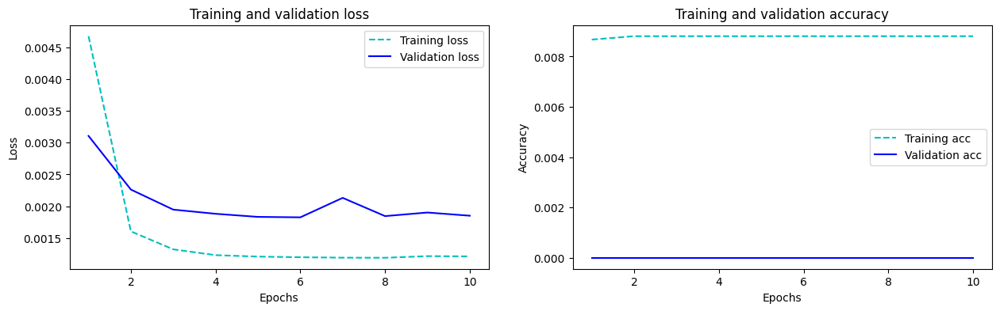

In [80]:
plot_curve(hist_0005)

In [81]:
predict_scaled_0005 = model_0005.predict(X_test)
predict_0005 = sc.inverse_transform(predict_scaled_0005)
test2['LSTM_0005'] = predict_0005
test2

10/10 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005,LSTM_0001
0,2021-12-16 09:10:00,0.111,0.661765,0.321854,0.351959,0.330268,0.325416
1,2021-12-16 09:11:00,0.112,0.661765,0.120153,0.148654,0.134199,0.116091
2,2021-12-16 09:12:00,0.116,0.661765,0.098979,0.143562,0.119554,0.104374
3,2021-12-16 09:13:00,0.112,0.661765,0.108276,0.150429,0.120861,0.113774
4,2021-12-16 09:14:00,0.099,0.661765,0.111055,0.147029,0.117477,0.110892
...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.661765,0.163278,0.198684,0.171629,0.164707
289,2021-12-16 13:59:00,0.169,0.661765,0.163046,0.198642,0.171516,0.164606
290,2021-12-16 14:00:00,0.147,0.661765,0.164024,0.199593,0.172385,0.165596
291,2021-12-16 14:01:00,0.145,0.661765,0.143435,0.178683,0.152335,0.144077


In [82]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [89]:
lstm_mse_error_unit_50_0005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0005'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_005,lstm_mse_error_unit_50_0005)

Better MSE value is :  0.0018300354978602964


,Model,MSE error
0,model,0.001830
1,model_1,0.001841


In [99]:
mse_data.loc[len(mse_data)] = ['Lstm mse error 50 adam learning rate 0.005', lstm_mse_error_unit_50_0005]

----------------------------------------------------------------------------------

### lr 0.001

#### Add frist layer: units = 50

In [84]:
model_0001 = Sequential()
model_0001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.001)
model_0001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0001 = model_0001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 7s 8ms/step - loss: 0.0073 - accuracy: 0.0087 - val_loss: 0.0056 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0026 - accuracy: 0.0088 - val_loss: 0.0039 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0020 - accuracy: 0.0088 - val_loss: 0.0033 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0017 - accuracy: 0.0088 - val_loss: 0.0028 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0015 - accuracy: 0.0088 - val_loss: 0.0023 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0021 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 3s 6ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val

Last train loss: 0.0011761399218812585
Last validation loss: 0.001939740963280201
Last train accuracy: 0.008808781392872334
Last validation accuracy: 0.0


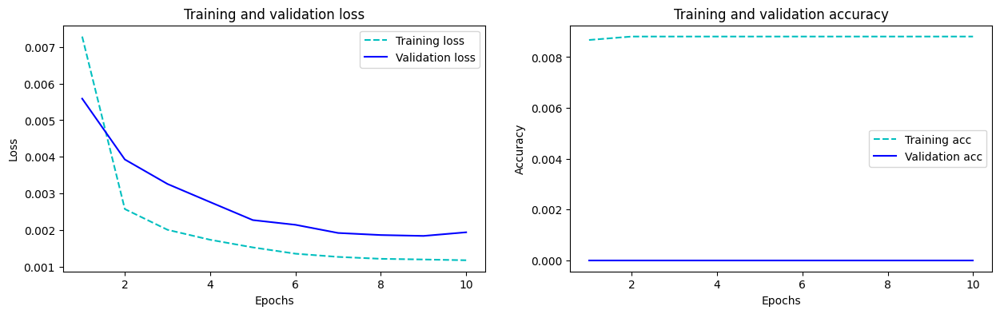

In [85]:
plot_curve(hist_0001)

In [86]:
predict_scaled_0001 = model_001.predict(X_test)
predict_0001 = sc.inverse_transform(predict_scaled_0001)
test2['LSTM_0001'] = predict_0001
test2

10/10 [==============================] - 0s 4ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005,LSTM_0001
0,2021-12-16 09:10:00,0.111,0.661765,0.321854,0.351959,0.330268,0.351959
1,2021-12-16 09:11:00,0.112,0.661765,0.120153,0.148654,0.134199,0.148654
2,2021-12-16 09:12:00,0.116,0.661765,0.098979,0.143562,0.119554,0.143562
3,2021-12-16 09:13:00,0.112,0.661765,0.108276,0.150429,0.120861,0.150429
4,2021-12-16 09:14:00,0.099,0.661765,0.111055,0.147029,0.117477,0.147029
...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.661765,0.163278,0.198684,0.171629,0.198684
289,2021-12-16 13:59:00,0.169,0.661765,0.163046,0.198642,0.171516,0.198642
290,2021-12-16 14:00:00,0.147,0.661765,0.164024,0.199593,0.172385,0.199593
291,2021-12-16 14:01:00,0.145,0.661765,0.143435,0.178683,0.152335,0.178683


In [87]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [90]:
lstm_mse_error_0001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0001'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_005,lstm_mse_error_0001)

Better MSE value is :  0.0018300354978602964


,Model,MSE error
0,model,0.001830
1,model_1,0.002654


In [100]:
mse_data.loc[len(mse_data)] = ['Lstm mse error 50 adam learning rate 0.001', lstm_mse_error_0001]
mse_data

,Model,LSTM lag10
0,Lstm mse error unit 50 adam,0.001867
1,Lstm mse error unit 50 sgd,0.005053
2,Lstm mse error unit 50 rmsprop,0.001882
3,Lstm mse error adam batch_size64,0.002490
4,Lstm mse error adam learning rate 0.1,0.010058
5,Lstm mse error adam learning rate 0.05,0.001830
6,Lstm mse error adam learning rate 0.01,0.002654
7,Lstm mse error adam learning rate 0.005,0.001841
8,Lstm mse error adam learning rate 0.001,0.002654


----------------------------------------------------------------------------------

## Optimizer adam

### Add frist layer: units = 100 learning rate 0.005

In [101]:
test3 = test.copy()

In [102]:
test3['LSTM_50'] = predict_005

In [103]:
model_1 = Sequential()
model_1.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_1.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.05)
model_1.compile(optimizer = opt, loss = 'mean_squared_error')
hist_1 = model_1.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 9s 12ms/step - loss: 0.2288 - accuracy: 0.0049 - val_loss: 0.1158 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 5s 10ms/step - loss: 0.1595 - accuracy: 0.0043 - val_loss: 0.2362 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 5s 10ms/step - loss: 0.1495 - accuracy: 0.0043 - val_loss: 0.3624 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 4s 10ms/step - loss: 0.1505 - accuracy: 0.0046 - val_loss: 0.1813 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 4s 10ms/step - loss: 0.1565 - accuracy: 0.0052 - val_loss: 0.3258 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 4s 10ms/step - loss: 0.1523 - accuracy: 0.0039 - val_loss: 0.1746 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 5s 10ms/step - loss: 0.1606 - accuracy: 0.0049 - val_loss: 0.035

Last train loss: 0.15243713557720184
Last validation loss: 0.09914487600326538
Last train accuracy: 0.003997831605374813
Last validation accuracy: 0.0


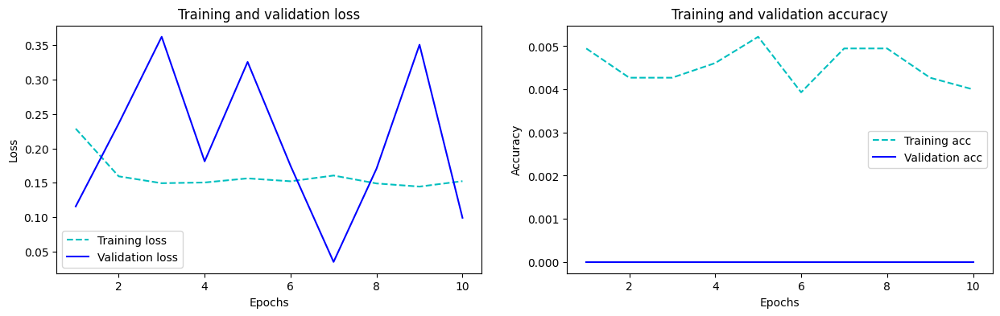

In [104]:
plot_curve(hist_1)

In [105]:
predict_scaled_1 = model_1.predict(X_test)
predict_1 = sc.inverse_transform(predict_scaled_1)
test3['LSTM_100'] = predict_1
test3

10/10 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100
0,2021-12-16 09:10:00,0.111,0.329080,0.497797
1,2021-12-16 09:11:00,0.112,0.144234,0.497797
2,2021-12-16 09:12:00,0.116,0.116886,0.497797
3,2021-12-16 09:13:00,0.112,0.117655,0.497797
4,2021-12-16 09:14:00,0.099,0.115138,0.497797
...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.167581,0.497797
289,2021-12-16 13:59:00,0.169,0.167261,0.497797
290,2021-12-16 14:00:00,0.147,0.167989,0.497797
291,2021-12-16 14:01:00,0.145,0.150287,0.497797


In [106]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_100'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [107]:
lstm_mse_error_unit_100 = mean_squared_error(test3['cloud_cover'], test3['LSTM_100'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_005,lstm_mse_error_unit_100)

Better MSE value is :  0.0018300354978602964


,Model,MSE error
0,model,0.00183
1,model_1,0.09865


In [108]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam frist layer unit 100 learning rate 0.05', lstm_mse_error_unit_100]

------------

### Add frist layer: units = 50 and Add Dropout = 0.1

In [109]:
model_2 = Sequential()
model_2.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_2.add(Dropout(0.1))
model_2.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.05)
model_2.compile(optimizer = opt, loss = 'mean_squared_error')
hist_2 = model_2.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 9s 10ms/step - loss: 0.0129 - accuracy: 0.0085 - val_loss: 0.0032 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 5s 10ms/step - loss: 0.0025 - accuracy: 0.0088 - val_loss: 0.0036 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 4s 8ms/step - loss: 0.0020 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0018 - accuracy: 0.0088 - val_loss: 0.0218 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0022 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0017 - accuracy: 0.0088 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 3s 7ms/step - loss: 0.0017 - accuracy: 0.0088 - val_loss: 0.0025 - v

Last train loss: 0.0017113813664764166
Last validation loss: 0.00247262348420918
Last train accuracy: 0.008808781392872334
Last validation accuracy: 0.0


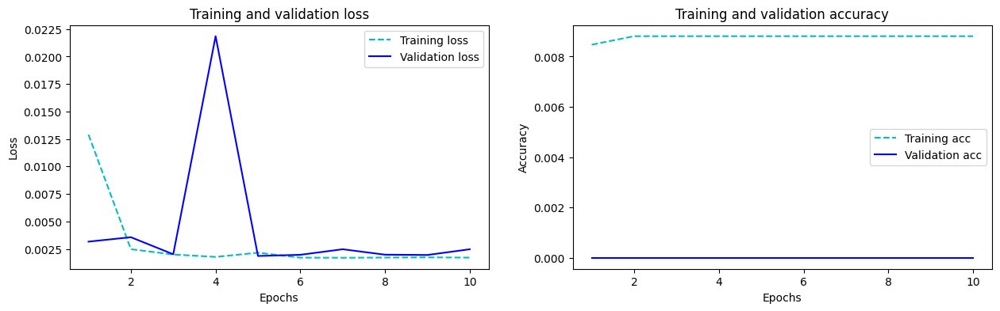

In [110]:
plot_curve(hist_2)

In [111]:
predict_scaled_2 = model_2.predict(X_test)
predict_2 = sc.inverse_transform(predict_scaled_2)
test3['LSTM_Drop_out'] = predict_2
test3

10/10 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out
0,2021-12-16 09:10:00,0.111,0.329080,0.497797,0.347044
1,2021-12-16 09:11:00,0.112,0.144234,0.497797,0.136266
2,2021-12-16 09:12:00,0.116,0.116886,0.497797,0.143166
3,2021-12-16 09:13:00,0.112,0.117655,0.497797,0.139407
4,2021-12-16 09:14:00,0.099,0.115138,0.497797,0.131828
...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.167581,0.497797,0.186925
289,2021-12-16 13:59:00,0.169,0.167261,0.497797,0.187178
290,2021-12-16 14:00:00,0.147,0.167989,0.497797,0.188124
291,2021-12-16 14:01:00,0.145,0.150287,0.497797,0.165064


In [112]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_Drop_out'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [113]:
lstm_mse_error_50_drop_out = mean_squared_error(test3['cloud_cover'], test3['LSTM_Drop_out'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_005,lstm_mse_error_50_drop_out)

Better MSE value is :  0.0018300354978602964


,Model,MSE error
0,model,0.00183
1,model_1,0.00246


In [114]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam 50 drop out 0.1 learning rate 0.05', lstm_mse_error_50_drop_out]

------------------------------------

### Add frist layer: units = 50 and Add second layer: unit = 50

In [115]:
model_3 = Sequential()
model_3.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_3.add(LSTM(units = 50))
model_3.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.05)
model_3.compile(optimizer = opt, loss = 'mean_squared_error')
hist_3 = model_3.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 12s 14ms/step - loss: 0.1407 - accuracy: 0.0044 - val_loss: 0.0794 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 5s 11ms/step - loss: 0.1263 - accuracy: 0.0030 - val_loss: 0.0934 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 5s 11ms/step - loss: 0.1262 - accuracy: 0.0041 - val_loss: 0.0667 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 5s 11ms/step - loss: 0.1266 - accuracy: 0.0039 - val_loss: 0.1304 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 5s 11ms/step - loss: 0.1230 - accuracy: 0.0038 - val_loss: 0.1594 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 5s 11ms/step - loss: 0.1233 - accuracy: 0.0042 - val_loss: 0.1403 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 5s 11ms/step - loss: 0.1254 - accuracy: 0.0043 - val_loss: 0.12

Last train loss: 0.022877708077430725
Last validation loss: 0.018261278048157692
Last train accuracy: 0.008605502545833588
Last validation accuracy: 0.0


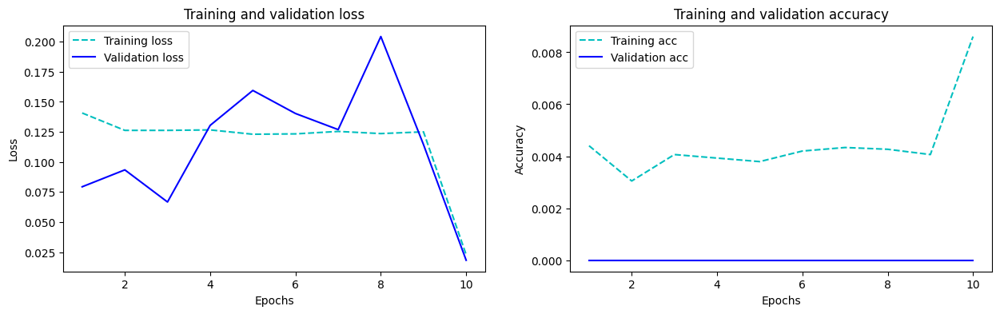

In [116]:
plot_curve(hist_3)

In [117]:
predict_scaled_3 = model_3.predict(X_test)
predict_3 = sc.inverse_transform(predict_scaled_3)
test3['LSTM_second_layer_50'] = predict_3
test3

10/10 [==============================] - 2s 5ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50
0,2021-12-16 09:10:00,0.111,0.329080,0.497797,0.347044,0.239334
1,2021-12-16 09:11:00,0.112,0.144234,0.497797,0.136266,0.231686
2,2021-12-16 09:12:00,0.116,0.116886,0.497797,0.143166,0.222511
3,2021-12-16 09:13:00,0.112,0.117655,0.497797,0.139407,0.214535
4,2021-12-16 09:14:00,0.099,0.115138,0.497797,0.131828,0.309655
...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.167581,0.497797,0.186925,0.173527
289,2021-12-16 13:59:00,0.169,0.167261,0.497797,0.187178,0.172821
290,2021-12-16 14:00:00,0.147,0.167989,0.497797,0.188124,0.176466
291,2021-12-16 14:01:00,0.145,0.150287,0.497797,0.165064,0.176444


In [118]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_second_layer_50'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [119]:
lstm_mse_error_second_layer = mean_squared_error(test3['cloud_cover'], test3['LSTM_second_layer_50'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_005,lstm_mse_error_second_layer)

Better MSE value is :  0.0018300354978602964


,Model,MSE error
0,model,0.00183
1,model_1,0.01817


In [120]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam second layer unit 50 learning rate 0.05', lstm_mse_error_second_layer]

---

### Add frist layer: units = 50 and Add second layer: unit = 100

In [121]:
model_4 = Sequential()
model_4.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_4.add(LSTM(units = 100))
model_4.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.05)
model_4.compile(optimizer = opt, loss = 'mean_squared_error')
hist_4 = model_4.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 32)

Epoch 1/10
462/462 [==============================] - 14s 17ms/step - loss: 0.1008 - accuracy: 0.0085 - val_loss: 0.0371 - val_accuracy: 0.0000e+00
Epoch 2/10
462/462 [==============================] - 6s 14ms/step - loss: 0.0108 - accuracy: 0.0088 - val_loss: 0.0132 - val_accuracy: 0.0000e+00
Epoch 3/10
462/462 [==============================] - 6s 14ms/step - loss: 0.0047 - accuracy: 0.0088 - val_loss: 0.0047 - val_accuracy: 0.0000e+00
Epoch 4/10
462/462 [==============================] - 6s 13ms/step - loss: 0.0034 - accuracy: 0.0088 - val_loss: 0.0031 - val_accuracy: 0.0000e+00
Epoch 5/10
462/462 [==============================] - 6s 13ms/step - loss: 0.0027 - accuracy: 0.0088 - val_loss: 0.0082 - val_accuracy: 0.0000e+00
Epoch 6/10
462/462 [==============================] - 6s 13ms/step - loss: 0.0032 - accuracy: 0.0088 - val_loss: 0.0031 - val_accuracy: 0.0000e+00
Epoch 7/10
462/462 [==============================] - 7s 15ms/step - loss: 0.0024 - accuracy: 0.0088 - val_loss: 0.00

Last train loss: 0.0028667033184319735
Last validation loss: 0.0032739308662712574
Last train accuracy: 0.008808781392872334
Last validation accuracy: 0.0


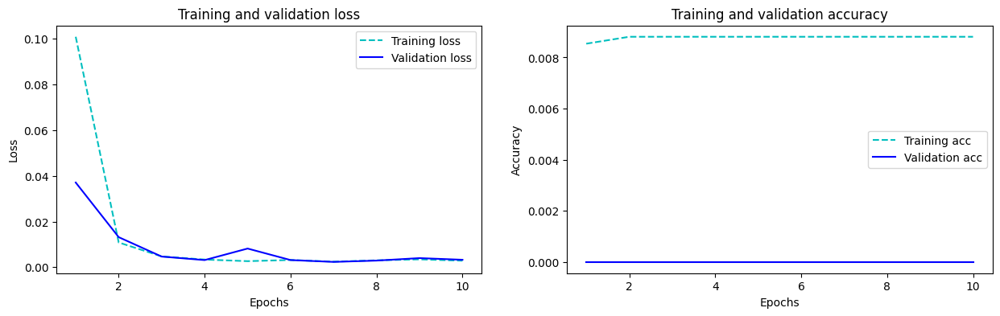

In [122]:
plot_curve(hist_4)

In [123]:
predict_scaled_4 = model_4.predict(X_test)
predict_4 = sc.inverse_transform(predict_scaled_4)
test3['LSTM_second_layer_100'] = predict_4
test3

10/10 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50,LSTM_second_layer_100
0,2021-12-16 09:10:00,0.111,0.329080,0.497797,0.347044,0.239334,0.371782
1,2021-12-16 09:11:00,0.112,0.144234,0.497797,0.136266,0.231686,0.193563
2,2021-12-16 09:12:00,0.116,0.116886,0.497797,0.143166,0.222511,0.165267
3,2021-12-16 09:13:00,0.112,0.117655,0.497797,0.139407,0.214535,0.157433
4,2021-12-16 09:14:00,0.099,0.115138,0.497797,0.131828,0.309655,0.146500
...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.167581,0.497797,0.186925,0.173527,0.203918
289,2021-12-16 13:59:00,0.169,0.167261,0.497797,0.187178,0.172821,0.203835
290,2021-12-16 14:00:00,0.147,0.167989,0.497797,0.188124,0.176466,0.204684
291,2021-12-16 14:01:00,0.145,0.150287,0.497797,0.165064,0.176444,0.187178


In [124]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_second_layer_100'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [125]:
lstm_mse_error_second_layer_unit100 = mean_squared_error(test3['cloud_cover'], test3['LSTM_second_layer_100'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_005,lstm_mse_error_second_layer_unit100)

Better MSE value is :  0.0018300354978602964


,Model,MSE error
0,model,0.001830
1,model_1,0.003258


In [126]:
mse_data.loc[len(mse_data)] = ['Lstm mse error adam second layer unit 100 learning rate 0.05', lstm_mse_error_second_layer_unit100]
mse_data

,Model,LSTM lag10
0,Lstm mse error unit 50 adam,0.001867
1,Lstm mse error unit 50 sgd,0.005053
2,Lstm mse error unit 50 rmsprop,0.001882
3,Lstm mse error adam batch_size64,0.002490
4,Lstm mse error adam learning rate 0.1,0.010058
5,Lstm mse error adam learning rate 0.05,0.001830
6,Lstm mse error adam learning rate 0.01,0.002654
7,Lstm mse error adam learning rate 0.005,0.001841
8,Lstm mse error adam learning rate 0.001,0.002654
9,Lstm mse error adam frist layer unit 100 learn...,0.098650


---

### Add frist layer: units = 50 and change epochs from 10 to 30

In [130]:
model_5 = Sequential()
model_5.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_5.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.05)
model_5.compile(optimizer = opt, loss = 'mean_squared_error')
hist_5 = model_5.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 30, batch_size = 32)

Epoch 1/30
462/462 [==============================] - 8s 8ms/step - loss: 0.0087 - accuracy: 0.0087 - val_loss: 0.0020 - val_accuracy: 0.0000e+00
Epoch 2/30
462/462 [==============================] - 3s 6ms/step - loss: 0.0014 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 3/30
462/462 [==============================] - 3s 6ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 4/30
462/462 [==============================] - 3s 6ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0018 - val_accuracy: 0.0000e+00
Epoch 5/30
462/462 [==============================] - 3s 6ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 6/30
462/462 [==============================] - 3s 6ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0019 - val_accuracy: 0.0000e+00
Epoch 7/30
462/462 [==============================] - 3s 6ms/step - loss: 0.0013 - accuracy: 0.0088 - val_loss: 0.0025 - val

Last train loss: 0.0012638940243050456
Last validation loss: 0.0018921684240922332
Last train accuracy: 0.008808781392872334
Last validation accuracy: 0.0


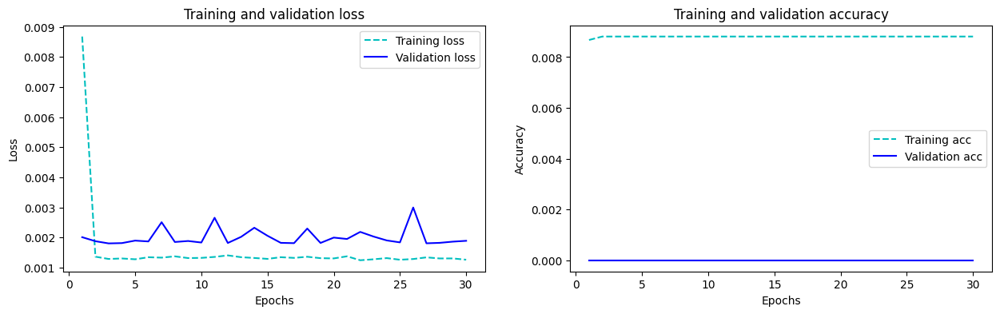

In [131]:
plot_curve(hist_5)

In [132]:
predict_scaled_5 = model_5.predict(X_test)
predict_5 = sc.inverse_transform(predict_scaled_5)
test3['LSTM_epoch30'] = predict_5
test3

10/10 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50,LSTM_second_layer_100,LSTM_epoch30
0,2021-12-16 09:10:00,0.111,0.329080,0.497797,0.347044,0.239334,0.371782,0.335249
1,2021-12-16 09:11:00,0.112,0.144234,0.497797,0.136266,0.231686,0.193563,0.161230
2,2021-12-16 09:12:00,0.116,0.116886,0.497797,0.143166,0.222511,0.165267,0.119661
3,2021-12-16 09:13:00,0.112,0.117655,0.497797,0.139407,0.214535,0.157433,0.116025
4,2021-12-16 09:14:00,0.099,0.115138,0.497797,0.131828,0.309655,0.146500,0.117239
...,...,...,...,...,...,...,...,...
288,2021-12-16 13:58:00,0.168,0.167581,0.497797,0.186925,0.173527,0.203918,0.176050
289,2021-12-16 13:59:00,0.169,0.167261,0.497797,0.187178,0.172821,0.203835,0.175932
290,2021-12-16 14:00:00,0.147,0.167989,0.497797,0.188124,0.176466,0.204684,0.176952
291,2021-12-16 14:01:00,0.145,0.150287,0.497797,0.165064,0.176444,0.187178,0.156139


In [133]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_epoch30'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [134]:
lstm_mse_error_unit_50_epoch30 = mean_squared_error(test3['cloud_cover'], test3['LSTM_epoch30'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_005,lstm_mse_error_unit_50_epoch30)

Better MSE value is :  0.0018300354978602964


,Model,MSE error
0,model,0.001830
1,model_1,0.001883


In [135]:
mse_data.loc[len(mse_data)] = ['Lstm mse error 50 epoch 30 learning rate 0.05', lstm_mse_error_unit_50_epoch30]

---

In [136]:
mse_data

,Model,LSTM lag10
0,Lstm mse error unit 50 adam,0.001867
1,Lstm mse error unit 50 sgd,0.005053
2,Lstm mse error unit 50 rmsprop,0.001882
3,Lstm mse error adam batch_size64,0.002490
4,Lstm mse error adam learning rate 0.1,0.010058
5,Lstm mse error adam learning rate 0.05,0.001830
6,Lstm mse error adam learning rate 0.01,0.002654
7,Lstm mse error adam learning rate 0.005,0.001841
8,Lstm mse error adam learning rate 0.001,0.002654
9,Lstm mse error adam frist layer unit 100 learn...,0.098650


In [137]:
minimum_mse= mse_data.loc[mse_data['LSTM lag10'].idxmin()]
minimum_mse

Model         Lstm mse error adam learning rate 0.05
LSTM lag10                                   0.00183
Name: 5, dtype: object

In [153]:
mse = pd.read_csv('mse.csv')
mse

,Model,LSTM lag10
0,Lstm mse error unit 50 adam,0.001867
1,Lstm mse error unit 50 sgd,0.005053
2,Lstm mse error unit 50 rmsprop,0.001882
3,Lstm mse error adam 50 batch_size64,0.002490
4,Lstm mse error adam 50 learning rate 0.1,0.010058
5,Lstm mse error adam 50 learning rate 0.05,0.001830
6,Lstm mse error adam 50 learning rate 0.01,0.002654
7,Lstm mse error adam 50 learning rate 0.005,0.001841
8,Lstm mse error adam 50 learning rate 0.001,0.002654
9,Lstm mse error adam frist layer unit 100 learn...,0.098650


In [155]:
data_mse = pd.read_csv('data_lstm_mse.csv')
data_mse

,Model,LSTM lag1,LSTM lag5
0,Lstm mse error unit 50 adam,0.001787,0.001836
1,Lstm mse error unit 50 sgd,0.001811,0.003412
2,Lstm mse error unit 50 rmsprop,0.001818,0.001846
3,Lstm mse error adam 50 batch_size64,0.001813,0.002645
4,Lstm mse error adam 50 learning rate 0.1,0.002110,0.002288
5,Lstm mse error adam 50 learning rate 0.05,0.002076,0.002237
6,Lstm mse error adam 50 learning rate 0.01,0.001828,0.001973
7,Lstm mse error adam 50 learning rate 0.005,0.001792,0.001838
8,Lstm mse error adam 50 learning rate 0.001,0.001828,0.001973
9,Lstm mse error adam frist layer unit 100,0.001802,0.001811


In [156]:
mse = pd.merge(data_mse,mse, on = 'Model', how='outer')
mse

,Model,LSTM lag1,LSTM lag5,LSTM lag10
0,Lstm mse error unit 50 adam,0.001787,0.001836,0.001867
1,Lstm mse error unit 50 sgd,0.001811,0.003412,0.005053
2,Lstm mse error unit 50 rmsprop,0.001818,0.001846,0.001882
3,Lstm mse error adam 50 batch_size64,0.001813,0.002645,0.002490
4,Lstm mse error adam 50 learning rate 0.1,0.002110,0.002288,0.010058
5,Lstm mse error adam 50 learning rate 0.05,0.002076,0.002237,0.001830
6,Lstm mse error adam 50 learning rate 0.01,0.001828,0.001973,0.002654
7,Lstm mse error adam 50 learning rate 0.005,0.001792,0.001838,0.001841
8,Lstm mse error adam 50 learning rate 0.001,0.001828,0.001973,0.002654
9,Lstm mse error adam frist layer unit 100,0.001802,0.001811,NaN


In [ ]:
mse.dtypes

In [157]:
# mse["LSTM lag1", "LSTM lag5"] = pd.to_numeric(mse["LSTM lag1", "LSTM lag5"])
minimum_mse1= mse[['LSTM lag1','LSTM lag5','LSTM lag10']].idxmin()
minimum_mse1

LSTM lag1      0
LSTM lag5     17
LSTM lag10     5
dtype: int64

In [158]:
minimum_mse1= mse.loc[mse[['LSTM lag1','LSTM lag5','LSTM lag10']].idxmin()]
minimum_mse1

,Model,LSTM lag1,LSTM lag5,LSTM lag10
0,Lstm mse error unit 50 adam,0.001787,0.001836,0.001867
17,Lstm mse error adam 100 second layer unit 100,NaN,0.001801,NaN
5,Lstm mse error adam 50 learning rate 0.05,0.002076,0.002237,0.001830


In [159]:
mse.to_csv('data_lstm_mse.csv',index=False)

In [160]:
model_005.save('model_lag10.h5')